Parth Lahane
1001912459

## CSE 6367 Programming Assignment 4 (P4)
## Spring 2023
## Panorama

#### NOTE: This is an optional programming assignment. If you submit all 4 programming assignments, we will count your best 3 out of 4 programming assignments towards your final grade.

## Dataset

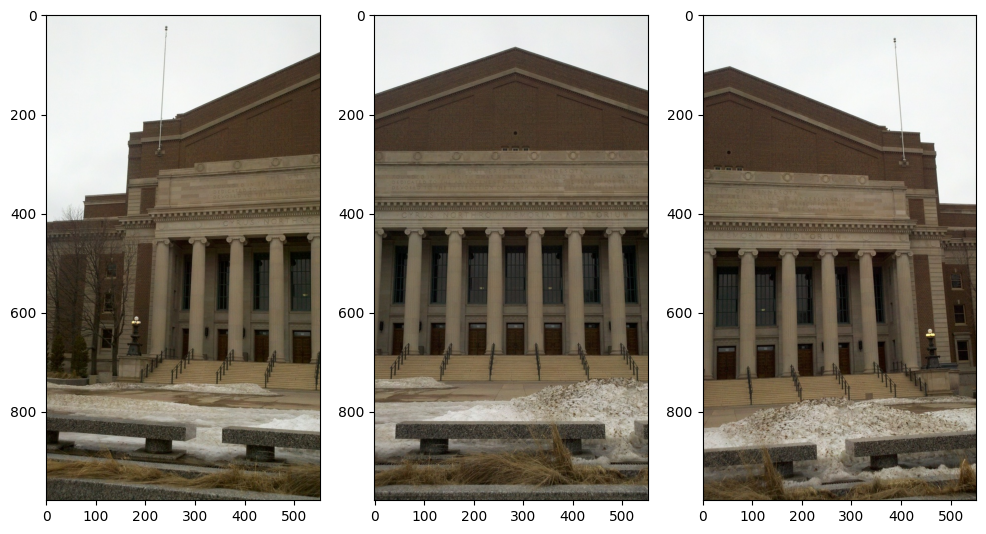

In [242]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imutils
from matplotlib import rcParams
from google.colab.patches import cv2_imshow
%matplotlib inline

# figure size in inches optional
rcParams['figure.figsize'] = 12 ,8

# read images
img1 = cv2.imread("Images/mall1.jpg")
img2 = cv2.imread("Images/mall2.jpg")
img3 = cv2.imread("Images/mall3.jpg")

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# display images
fig, ax = plt.subplots(1,3)
ax[0].imshow(img1)
ax[1].imshow(img2)
ax[2].imshow(img3)

## Assignment Instructions:

In this assignment, you will perform image stitching and create a panorama of stitched images. Here are some basic steps you need to perform for image stiching:

    1. Detecting keypoints (DoG, Harris, etc.) and extracting local invariant descriptors (SIFT, SURF, ORB etc.) from two input images
    2. Matching the descriptors between the images
    3. Estimate a homography matrix using our matched feature vectors
    4. Applying a warping transformation using the homography matrix obtained from Step #3
    
<b> You may use opencv or other libraries for doing different tasks of this programming assignment.<\b>

In [243]:
def ImageLoader(img_path):
  return cv2.imread(img_path)

In [244]:
def colorConvert(img, color):
  return cv2.cvtColor(img, color)

In [245]:
def detectKeypoints(img):
  orb = cv2.ORB_create()
  kp = orb.detect(img,None)
  kp, des = orb.compute(img, kp)

  img2 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
  cv2_imshow(img2)
  return kp, des

In [246]:
def featureMatching(des1, des2, kp1, kp2, img_dst, img_src):
  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
  matches = bf.match(des1,des2)
  matches = sorted(matches, key = lambda x:x.distance)
  matched_image = cv2.drawMatches(img_dst,kp1,img_src,kp2,matches[:50],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(matched_image)
  return matches

In [247]:
def homography(matches, img_src, img_dst, kp1, kp2):
  pts_src = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
  pts_dst = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
  h, _ = cv2.findHomography(pts_src, pts_dst, cv2.RANSAC, 15.0)
  return h

In [248]:
def imageCoordinates(rows, cols):
  list_of_points = np.float32([[0,0], [0,rows], [cols,rows], [cols,0]]) 
  return list_of_points.reshape(-1,1,2)

In [249]:
def warpImages(img1, img2, H):
    rows1, cols1 = img1.shape[:2]
    rows2, cols2 = img2.shape[:2]
    image1_points = imageCoordinates(rows1, cols1)
    image2_points = imageCoordinates(rows2, cols2)
    
    updated_image2_points = cv2.perspectiveTransform(image2_points, H)
    
    merged_imaged_points = np.concatenate((image1_points, updated_image2_points), axis=0)

    x_min, y_min = np.int32(merged_imaged_points.min(axis=0).flatten() - 0.5)
    x_max, y_max = np.int32(merged_imaged_points.max(axis=0).flatten() + 0.5) 
    
    H_translation = np.array([[1, 0, -x_min], [0, 1, -y_min], [0,0,1]])
    
    output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max - x_min, y_max - y_min))

    output_img[-y_min:rows1+-y_min, 
               -x_min:cols1+-x_min] = img1
    
    return output_img

In [250]:
def trim(frame):
    if not np.sum(frame[0]):
        return trim(frame[1:])
    if not np.sum(frame[-1]):
        return trim(frame[:-2])
    if not np.sum(frame[:,0]):
        return trim(frame[:,1:])
    if not np.sum(frame[:,-1]):
        return trim(frame[:,:-2])
    return frame

In [251]:
img_left = ImageLoader('./Images/mall1.jpg')
img_center = ImageLoader('./Images/mall2.jpg')
img_right = ImageLoader('./Images/mall3.jpg')
img_left_gray = colorConvert(img_left, cv2.COLOR_BGR2GRAY)
img_center_gray = colorConvert(img_center, cv2.COLOR_BGR2GRAY)
img_righ_gray = colorConvert(img_right, cv2.COLOR_BGR2GRAY)

In [252]:
def panorama(img_left, img_right):
  kp_right, des_right = detectKeypoints(img_right)
  kp_left, des_left = detectKeypoints(img_left)
  m1 = featureMatching(des_left, des_right, kp_left, kp_right, img_right, img_left)
  h1 = homography(m1, img_left, img_right, kp_left, kp_right)
  return warpImages(img_right, img_left, h1)  

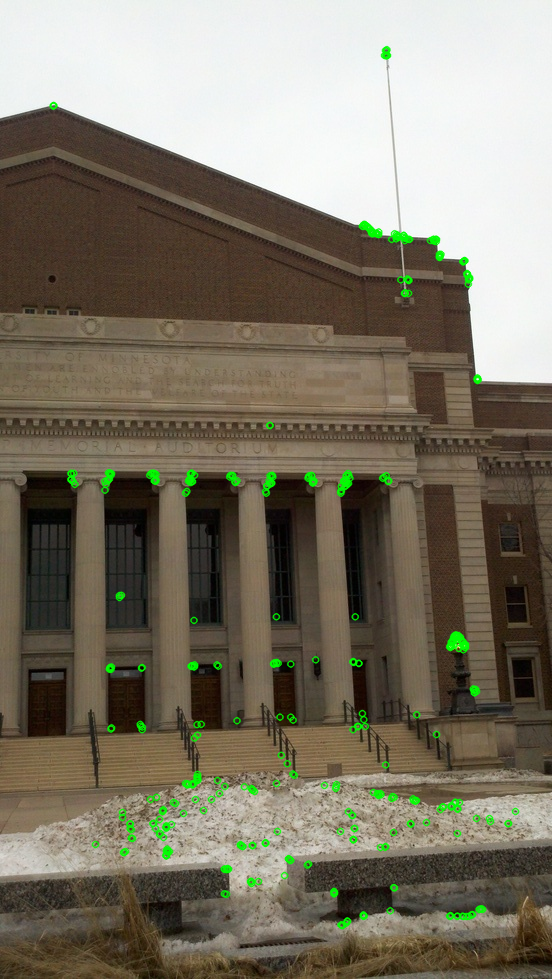

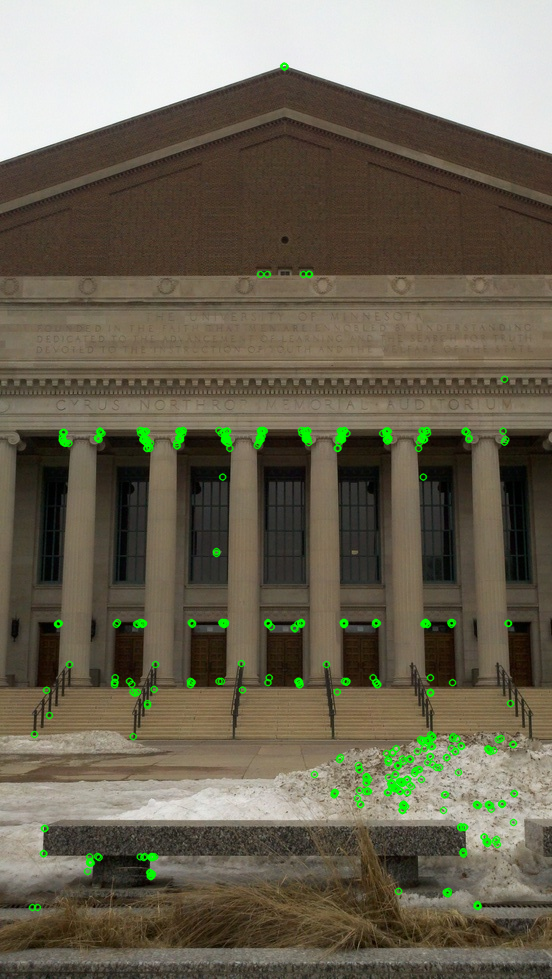

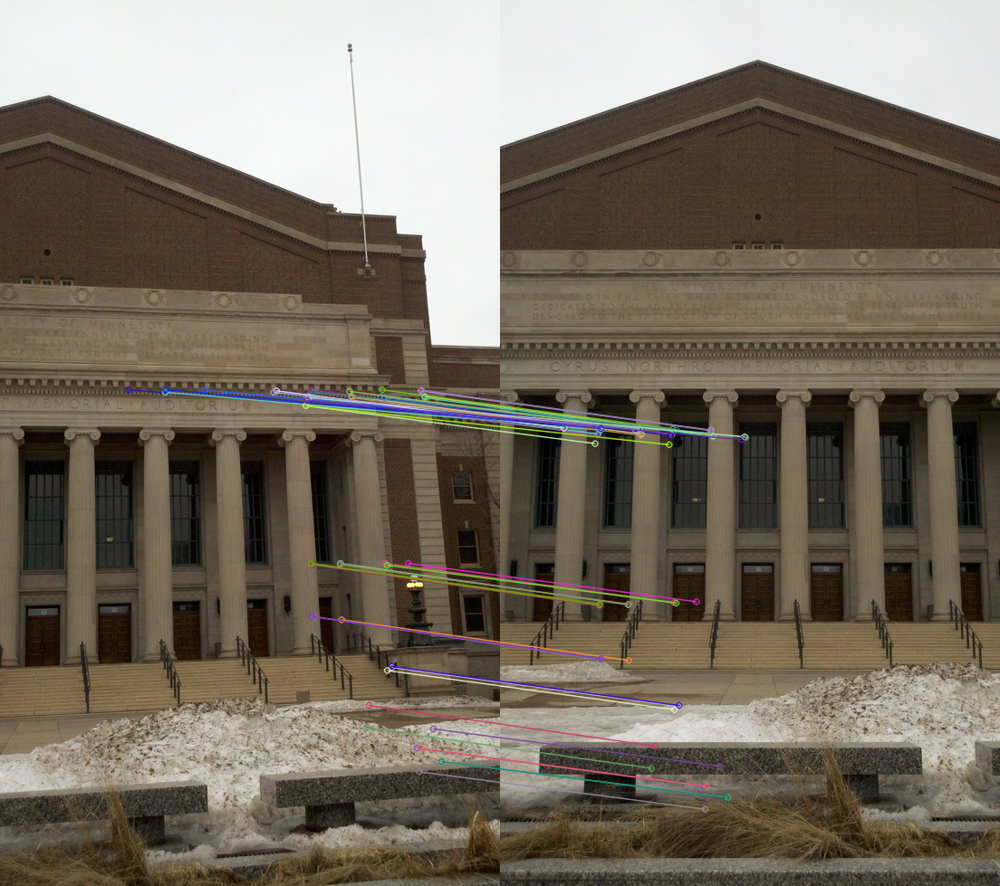

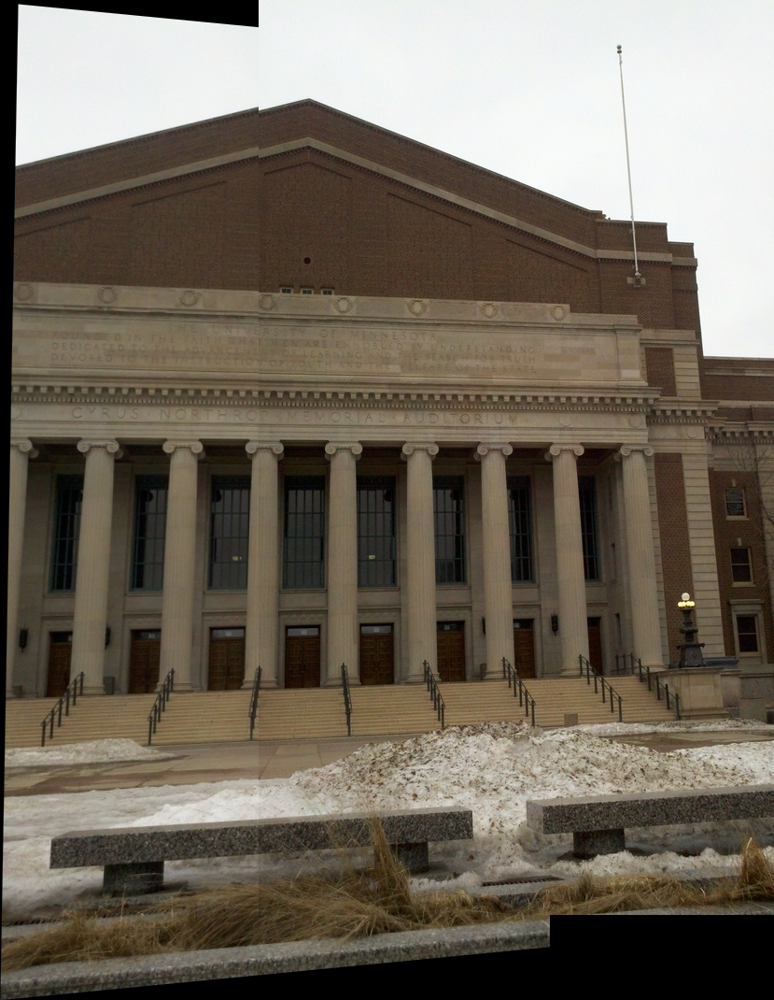

In [253]:
stitched_image_1 = trim(panorama(img_center, img_right))
cv2_imshow(stitched_image_1)

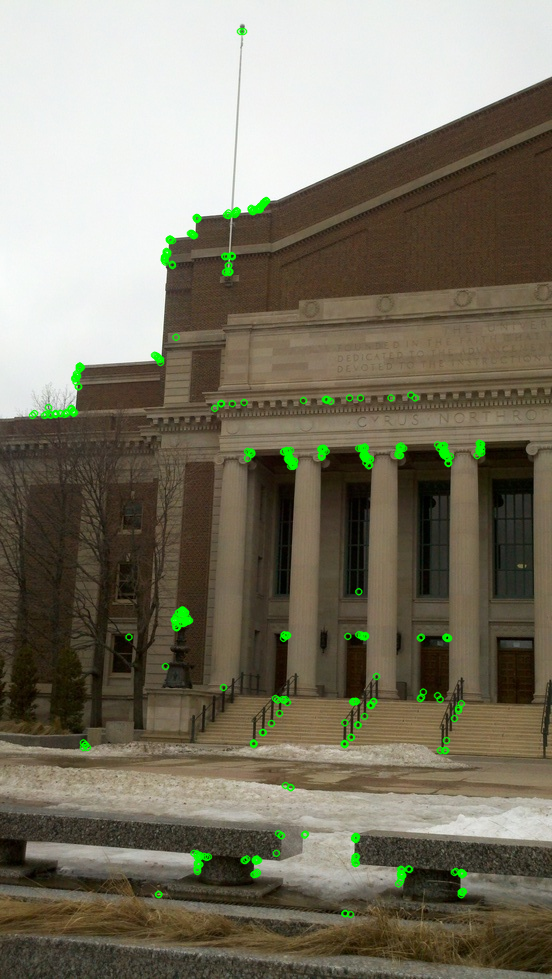

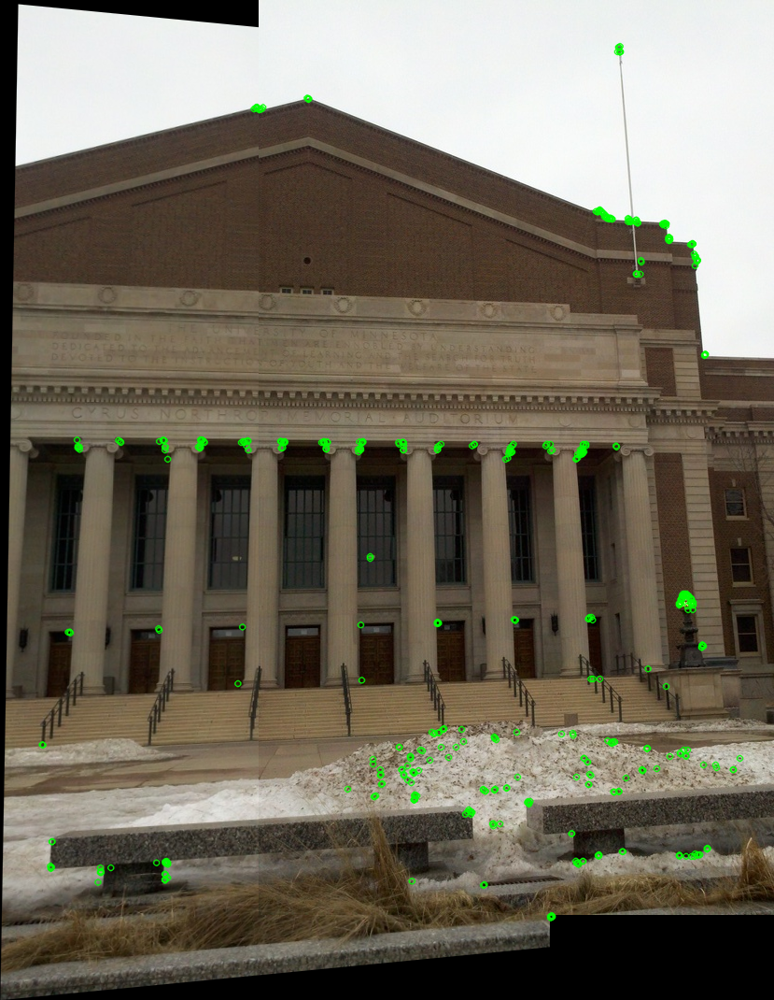

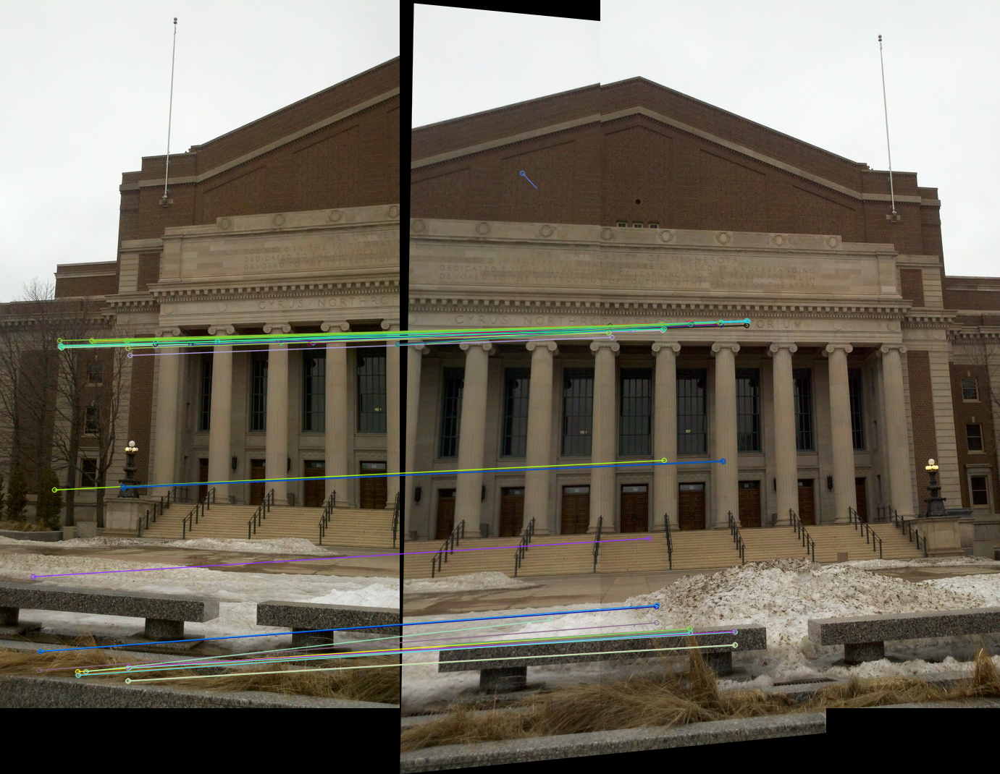

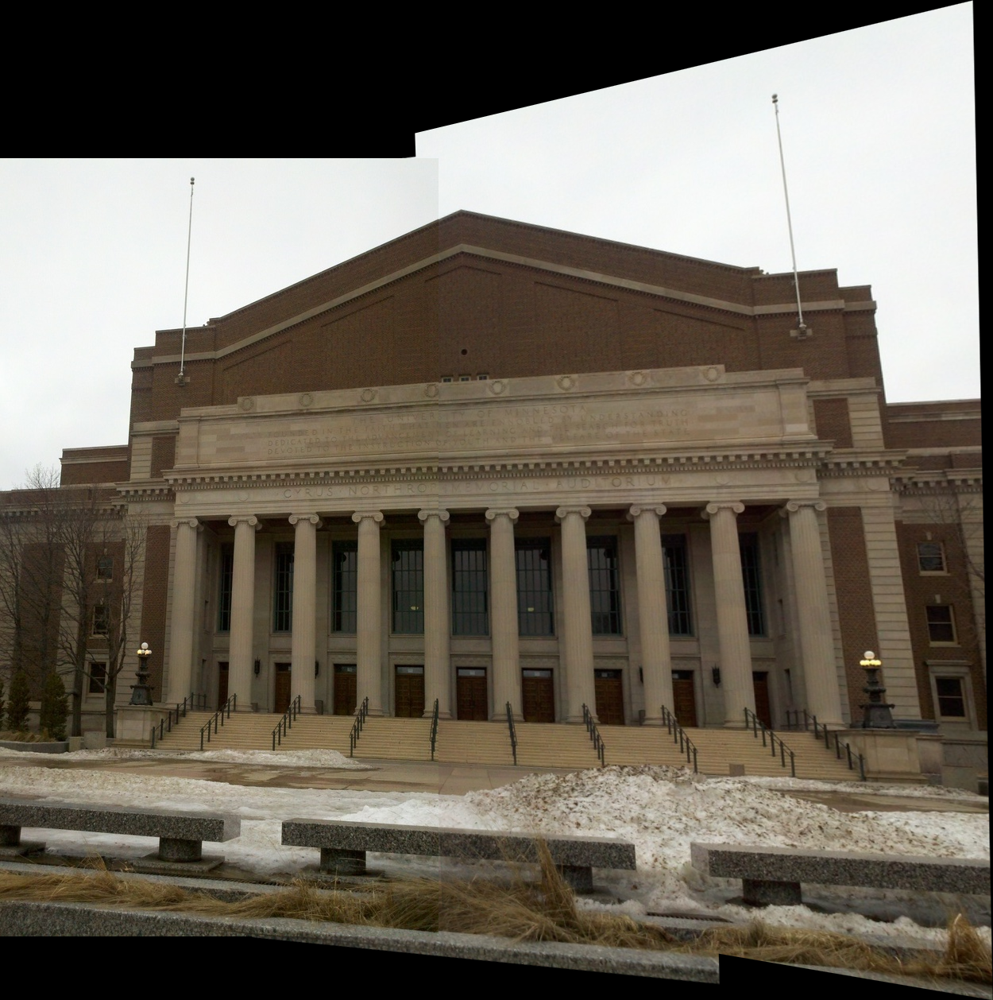

In [254]:
final_image = trim(panorama(stitched_image_1, img_left))
cv2_imshow(final_image)

### Submission Guidelines:
        
        Submit through Canvas your source code in a single .ipynb file. 
        The name of the .ipynb file should be YourStudentID.ipynb. (For example: 1001234567.ipynb)
        The images are available in the ./Images directory. Your TA will use the same directory name to grade your submission.
        You don't need to attach the images folder with your submission.